# Using Pretrained Model Weights from Kaggle

#### This notebook is the first step in our pipeline where we load a pre-trained Detectron2 model and use it to predict where the holds are located within the images of the climbing walls. We input the images in data/images and receive a structured output. To prepare the model outputs for our dataset, we took the predictions produced by Detectron2 and reorganized them into the COCO formatuse the model to create on a set of images. 

### Install Dependencies

In [1]:
!pip install --no-build-isolation 'git+https://github.com/facebookresearch/detectron2.git'
!pip install kagglehub
!pip install torchvision
!pip install opencv-python



  Cloning https://github.com/facebookresearch/detectron2.git to /private/var/folders/97/0ktd2h2x56j17zr5v8sj3slr0000gn/T/pip-req-build-qkrku4lz
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /private/var/folders/97/0ktd2h2x56j17zr5v8sj3slr0000gn/T/pip-req-build-qkrku4lz
  Resolved https://github.com/facebookresearch/detectron2.git to commit fd27788985af0f4ca800bca563acdb700bb890e2
  Preparing metadata (pyproject.toml) ... done

[notice] A new release of pip is available: 25.0 -> 25.3
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 25.0 -> 25.3
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 25.0 -> 25.3
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 25.0 -> 25.3
[notice] To update, run: pip install --upgrade pip


### Import Packages

In [2]:
import os
import cv2
import matplotlib.pyplot as plt
from detectron2.config import get_cfg
from detectron2.engine import DefaultPredictor
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
import json
import pycocotools.mask as mask_util

### Use Downloaded weights (model_final.pth) and configurations (experiment_config.yml)

In [3]:
cfg = get_cfg()
cfg.merge_from_file("/Users/eden2025/MSAIF25/ml_project_msai/experiment_config.yml")
cfg.MODEL.WEIGHTS = os.path.join(
    "/Users/eden2025/MSAIF25/ml_project_msai",
    "model_final.pth"
)
cfg.MODEL.DEVICE='cpu'

### Testing Sample Image with Weights

In [15]:

SAMPLE_IMAGE = "/Users/eden2025/MSAIF25/ml_project_msai//data/images/IMG_7278.JPG"

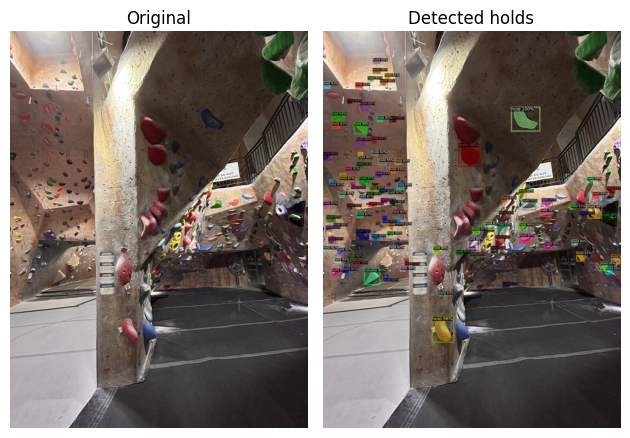

In [16]:

# Set metadata, in this case only the class names for plotting
MetadataCatalog.get("meta").thing_classes = ["hold", "volume"]
metadata = MetadataCatalog.get("meta")

predictor = DefaultPredictor(cfg)

img = cv2.imread(SAMPLE_IMAGE)
outputs = predictor(img)
v = Visualizer(
    img[:, :, ::-1],
    metadata=metadata
)

out_predictions = v.draw_instance_predictions(outputs["instances"].to("cpu"))
img_holds = out_predictions.get_image()
# display the results
fig, (ax1, ax2) = plt.subplots(1, 2)
ax1.imshow(img[:, :, ::-1])
ax1.axis('off')
ax1.set_title('Original')

ax2.imshow(img_holds)
ax2.axis('off')
ax2.set_title('Detected holds')

fig.tight_layout()
plt.show()

### Putting all our image inputs through pretrained model

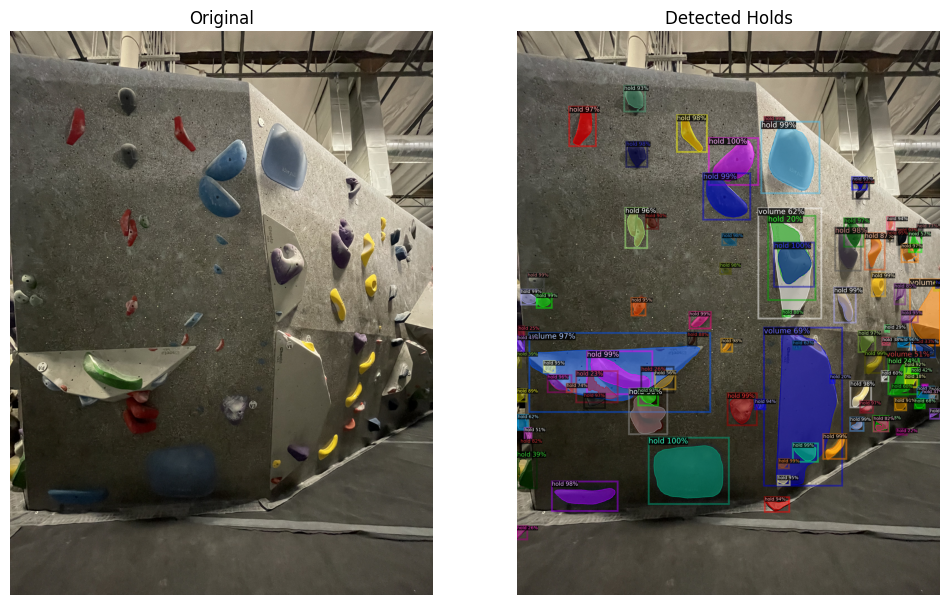

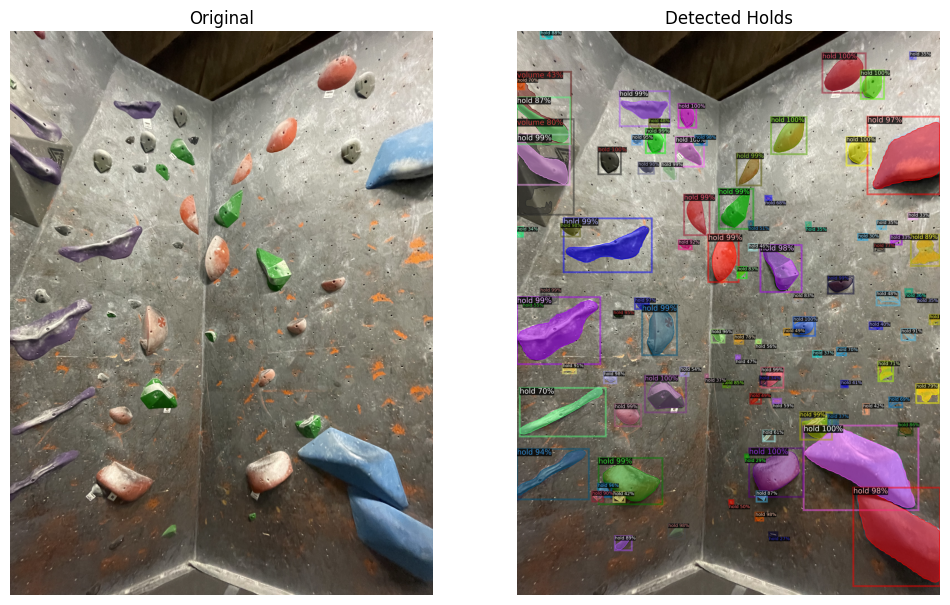

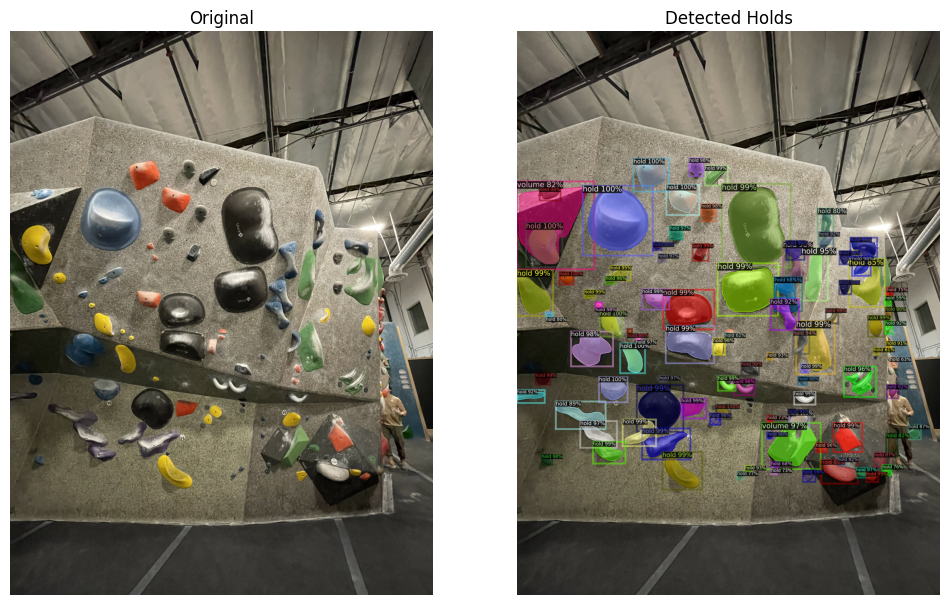

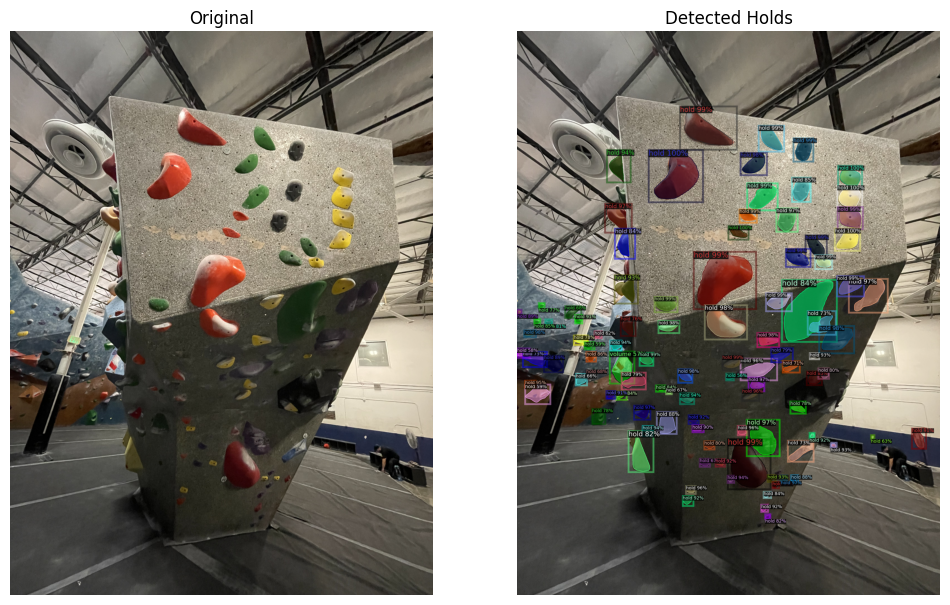

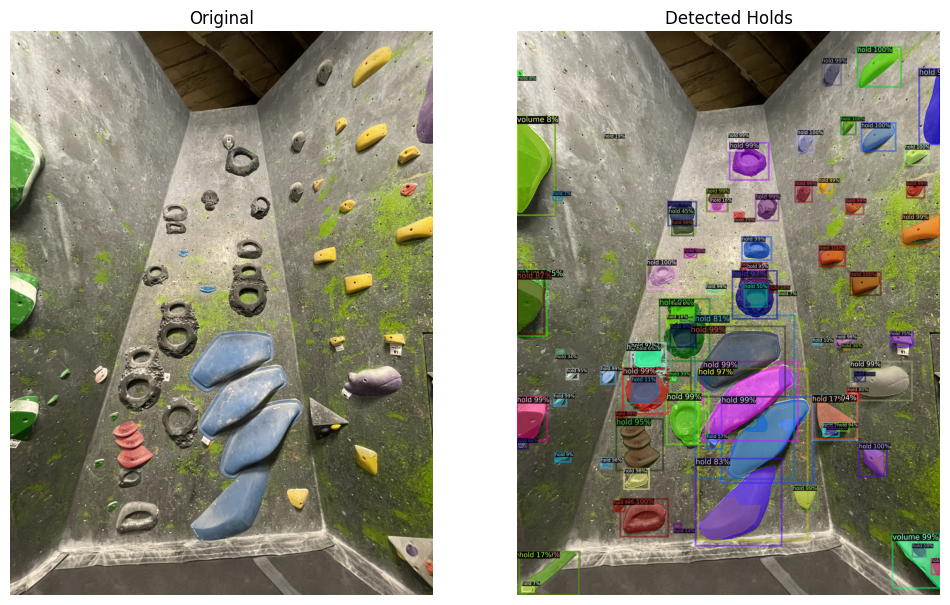

...

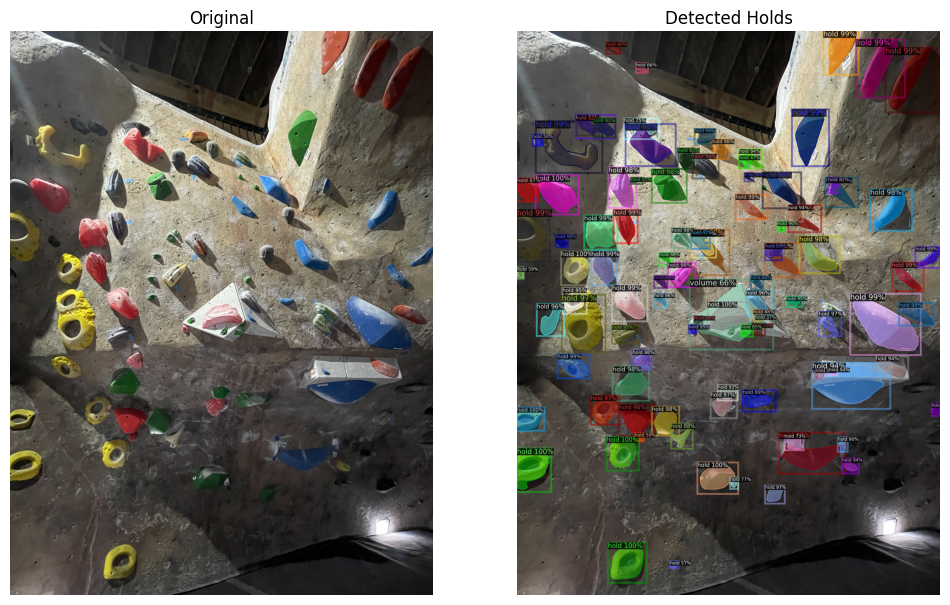

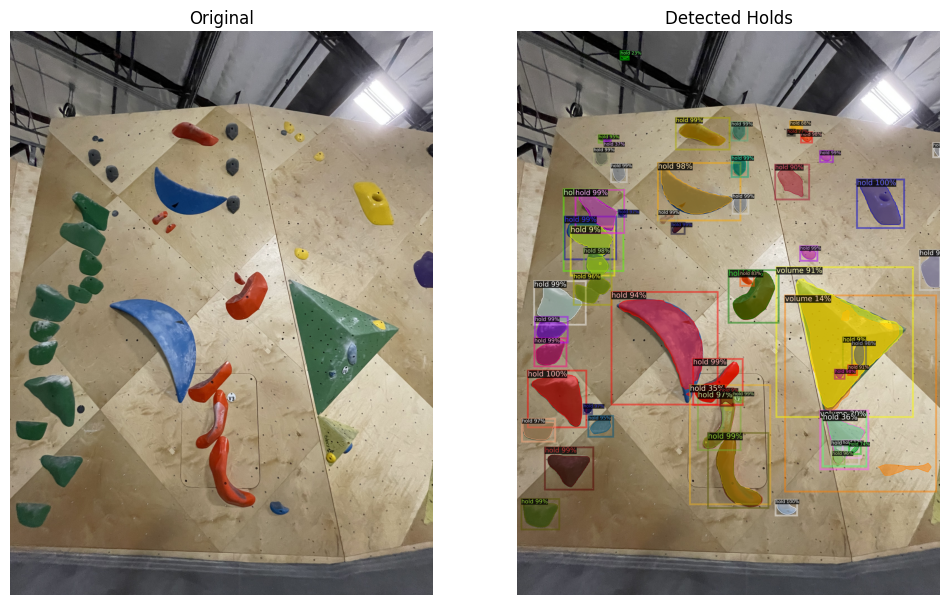

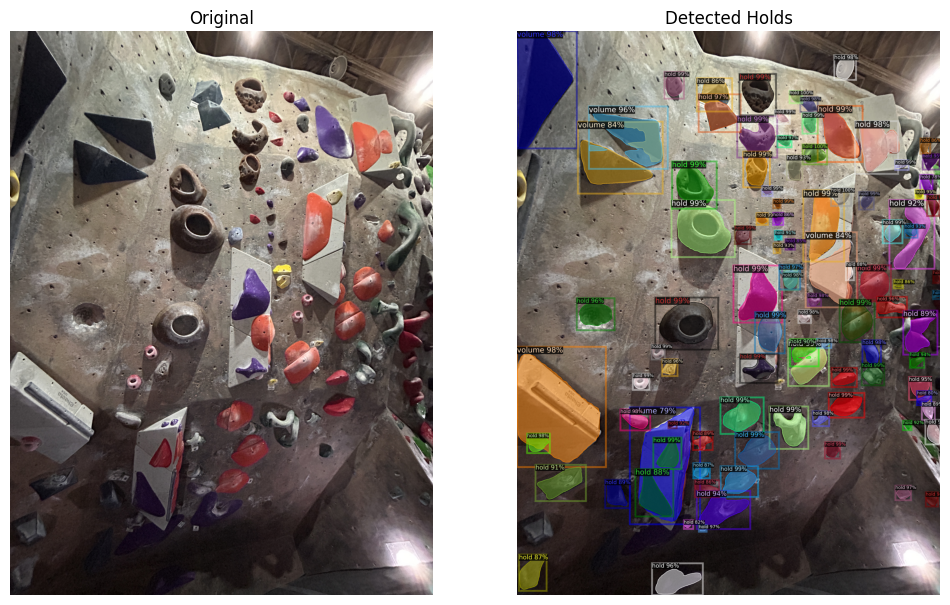

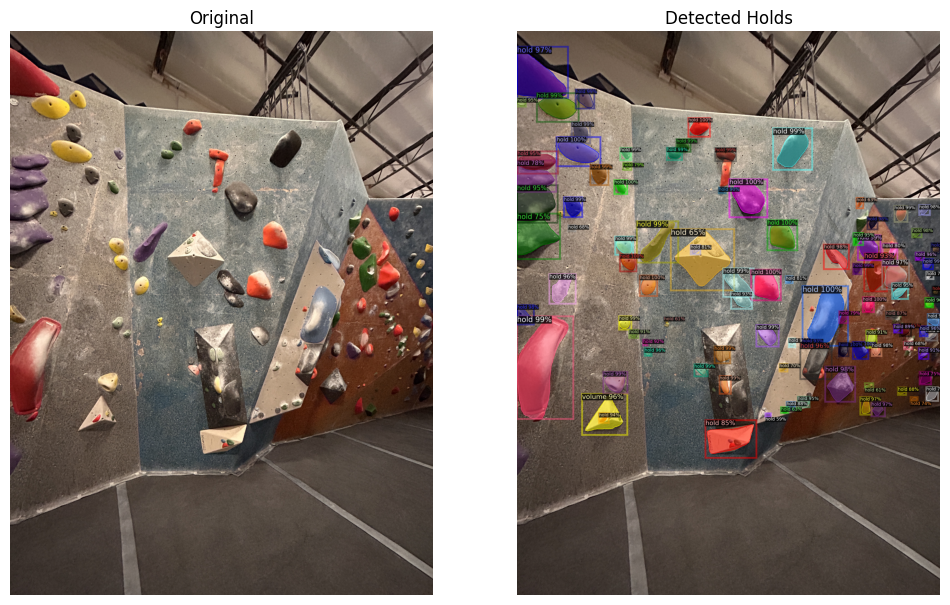

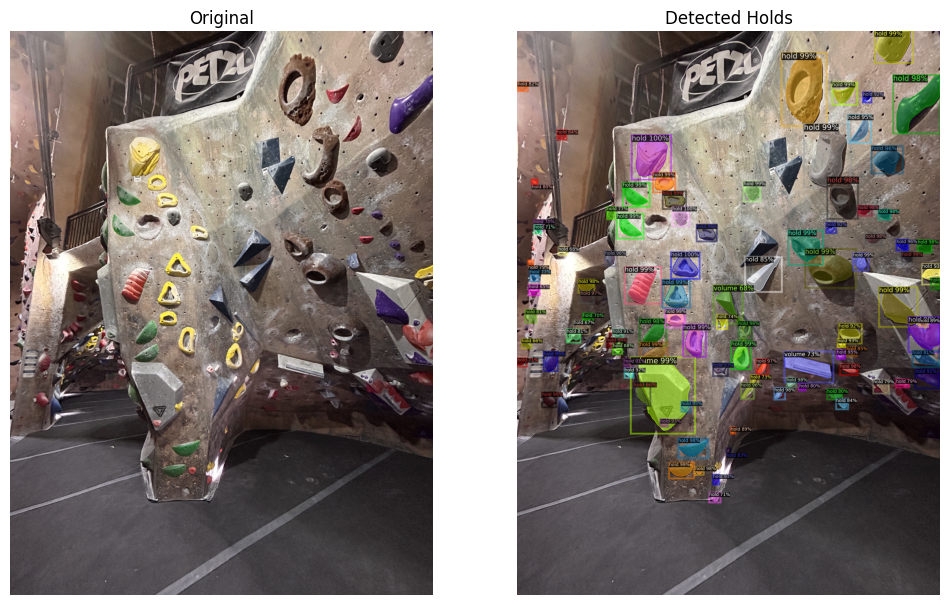

In [ ]:

images_folder = "/Users/eden2025/MSAIF25/ml_project_msai/data/images"
output_folder = "/Users/eden2025/MSAIF25/ml_project_msai/data/predictions"   # optional
os.makedirs(output_folder, exist_ok=True)
outputs = []
count = 0

# Loop through all images
for filename in os.listdir(images_folder):
    if not filename.lower().endswith((".jpg", ".jpeg", ".png")):
        continue

    img_path = os.path.join(images_folder, filename)
    img = cv2.imread(img_path)

    if img is None:
        print(f"⚠️ Could not read: {img_path}")
        continue

    # Run model inference
    outputs = predictor(img)
    # print(output)
    # outputs.append(output)
    
    

    # Visualize predictions
    if count > 5: 
        v = Visualizer(img[:, :, ::-1], metadata=metadata)
        vis_img = v.draw_instance_predictions(outputs["instances"].to("cpu")).get_image()

        # Display side-by-side
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 8))
        ax1.imshow(img[:, :, ::-1])
        ax1.axis("off")
        ax1.set_title("Original")

        ax2.imshow(vis_img)
        ax2.axis("off")
        ax2.set_title("Detected Holds")

        plt.show()
        
    count += 1

        # Save result (optional)
        # save_path = os.path.join(output_folder, filename)
        # cv2.imwrite(save_path, vis_img[:, :, ::-1])
        # print(f"Saved: {save_path}")

### Transforming Detectron output into COCO annotation format 

In [7]:

output_file_path = "/Users/eden2025/MSAIF25/ml_project_msai/data/coco_output_predictions.json"

output_folder = os.path.dirname(output_file_path)

In [ ]:
# Set metadata, in this case only the class names for plotting

MetadataCatalog.get("meta").thing_classes = ["hold", "volume"]
metadata = MetadataCatalog.get("meta")

predictor = DefaultPredictor(cfg)

images_folder = "/Users/eden2025/MSAIF25/ml_project_msai/data/images"
output_json_path = "/Users/eden2025/MSAIF25/ml_project_msai/data/predictions/annotations.json"

coco = {
    "images": [],
    "annotations": [],
    "categories": [
        {"id": 1, "name": "hold", "supercategory": "hold"}
    ]
}

ann_id = 1
img_id = 1

for filename in os.listdir(images_folder):

    if not filename.lower().endswith((".jpg", ".jpeg", ".png")):
        continue

    img_path = os.path.join(images_folder, filename)
    img = cv2.imread(img_path)

    if img is None:
        print(f"⚠️ Could not read: {img_path}")
        continue

    height, width = img.shape[:2]

    # Run Detectron2 inference
    output = predictor(img)
    instances = output["instances"].to("cpu")

    boxes = instances.pred_boxes.tensor.numpy()
    masks = instances.pred_masks.numpy()

    # -----------------------------
    # Add image entry (your format)
    # -----------------------------
    coco["images"].append({
        "id": img_id,
        "width": width,
        "height": height,
        "file_name": filename,
        "license": 0,
        "flickr_url": "",
        "coco_url": "",
        "date_captured": 0
    })

    # -----------------------------
    # Add annotations
    # -----------------------------
    for i in range(len(instances)):
        x1, y1, x2, y2 = boxes[i]
        bbox = [float(x1), float(y1), float(x2 - x1), float(y2 - y1)]

        # COCO-style RLE encoding
        rle = mask_util.encode(masks[i].astype("uint8", order="F"))
        rle["counts"] = rle["counts"].decode()   # convert bytes → string

        coco["annotations"].append({
            "id": ann_id,
            "image_id": img_id,
            "category_id": 1,   # all holds = category 1
            "segmentation": rle,
            "bbox": bbox,
            "area": float(mask_util.area(rle)),
            "iscrowd": 0
        })

        ann_id += 1

    img_id += 1

# -----------------------------
# Save JSON exactly like yours
# -----------------------------
with open(output_file_path, "w") as f:
    json.dump(coco, f)


In [ ]:
# -----------------------------
print(coco[0])
with open(output_file_path, "w") as f:
    json.dump(coco, f)

In [ ]:

images_folder = "/Users/eden2025/MSAIF25/ml_project_msai/data/images"
output_json_path = "/Users/eden2025/MSAIF25/ml_project_msai/data/predictions/annotations.json"

coco = {
    "images": [],
    "annotations": [],
    "categories": [
        {"id": 1, "name": "hold", "supercategory": "hold"}
    ]
}

ann_id = 1
img_id = 1

for filename in os.listdir(images_folder):

    if not filename.lower().endswith((".jpg", ".jpeg", ".png")):
        continue

    img_path = os.path.join(images_folder, filename)
    img = cv2.imread(img_path)

    if img is None:
        print(f"⚠️ Could not read: {img_path}")
        continue

    height, width = img.shape[:2]

    # Run Detectron2 inference
    output = predictor(img)
    instances = output["instances"].to("cpu")

    boxes = instances.pred_boxes.tensor.numpy()
    masks = instances.pred_masks.numpy()

    # -----------------------------
    # Add image entry (your format)
    # -----------------------------
    coco["images"].append({
        "id": img_id,
        "width": width,
        "height": height,
        "file_name": filename,
        "license": 0,
        "flickr_url": "",
        "coco_url": "",
        "date_captured": 0
    })

    # -----------------------------
    # Add annotations
    # -----------------------------
    for i in range(len(instances)):
        x1, y1, x2, y2 = boxes[i]
        bbox = [float(x1), float(y1), float(x2 - x1), float(y2 - y1)]

        # COCO-style RLE encoding
        rle = mask_util.encode(masks[i].astype("uint8", order="F"))
        rle["counts"] = rle["counts"].decode()   # convert bytes → string

        coco["annotations"].append({
            "id": ann_id,
            "image_id": img_id,
            "category_id": 1,   # all holds = category 1
            "segmentation": rle,
            "bbox": bbox,
            "area": float(mask_util.area(rle)),
            "iscrowd": 0
        })

        ann_id += 1

    img_id += 1

# -----------------------------
# Save JSON exactly like yours
# -----------------------------
with open(output_json_path, "w") as f:
    json.dump(coco, f)



NameError: name 'output_file_path' is not defined

In [10]:
import json

json_path = "/Users/eden2025/MSAIF25/ml_project_msai/data/coco_output_predictions.json"

# Load the COCO file
with open(json_path, "r") as f:
    coco = json.load(f)

annotations = coco.get("annotations", [])

# Print first 100 (or fewer if not available)
num_to_print = min(100, len(annotations))

print(f"Showing {num_to_print} of {len(annotations)} annotations:\n")

for i in range(num_to_print):
    ann = annotations[i]
    print(f"Annotation {i+1}:")
    print(json.dumps(ann, indent=2))
    print("-" * 80)


Showing 100 of 6765 annotations:

Annotation 1:
{
  "id": 1,
  "image_id": 1,
  "category_id": 1,
  "segmentation": {
    "size": [
      4032,
      3024
    ],
    "counts": "VlZh8c0nl3n0^O5K4M4L3M3M3N2N2N1N2O1N3N1M3M3M3M3M3M4L3L4N2N2O1O2M2O100O1N3N1O1N2N3M2M3N3M2N2N3N1O1O2N1O1O2O0O2N1O1O2N1O2M2N3M2M4M2N2N3M2O2N1N3N1O1O1O1N3N1N2M3N2N2M3N2M3N2M3N3M2N2O1O1O1O1O1O1N2O1N2N2N2N2M3M3N2O0O2O1O1N200O1O1O1O1O1O1N101N2M3L4M3M2N3M3N2M3N101O1N2O001O0O2O0O2N2N1N3N1N3N2N1O2O1N101O1O010O1N2O001N2N2N1M4M3M3M3M2O2N2N2N2N2O001N2O1N2N2N2N2N1N3M3M3N2O1N2O1N2O00100O1O1O001N2O1N1O2N1K6J6K4L5M2O2O0O2O00001O00O1000O10O0100O2M2O1O101N10001O001O001O0O100O1O1O1N1O1O1O2N101O001O1O101N10000O2N100O0O2O0O2N0100001O0100000000001O0000000O1O010N1O1O1000001O00100O10000O100O10O010O1O1N1O2N2O1O001O1O100O10000O01000O1O100O1O1O1O2N1O1O2N1O2O001O001O001N101O0O2N1O2M2O1N3N1O10000O10010O001O001O1N101N2N2N1N3O1N1O2O1N2O1O001O1O1O2N1O1N2O2L3N2N3M2N2O1N3N1N3N1N2O2N1O2M4M2N2M3N2N2M2O2M3N1O2M3N1O2M2O2N1N2O2N2M3N2M3M3M3M4L3M4L4K5L

In [12]:
import json

json_path = "/Users/eden2025/MSAIF25/ml_project_msai/data/annotations/hold_annotations1.json"

# Load the COCO file
with open(json_path, "r") as f:
    coco = json.load(f)

annotations = coco.get("annotations", [])

# Print first 100 (or fewer if not available)
num_to_print = min(100, len(annotations))

print(f"Showing {num_to_print} of {len(annotations)} annotations:\n")

for i in range(num_to_print):
    ann = annotations[i]
    print(f"Annotation {i+1}:")
    print(json.dumps(ann, indent=2))
    print("-" * 80)

Showing 100 of 562 annotations:

Annotation 1:
{
  "id": 1,
  "image_id": 1,
  "category_id": 1,
  "segmentation": {
    "counts": [
      6058778,
      13,
      4016,
      23,
      4007,
      29,
      4002,
      32,
      3999,
      36,
      3995,
      40,
      3992,
      42,
      3989,
      46,
      3986,
      51,
      3981,
      56,
      3975,
      62,
      3970,
      66,
      3966,
      69,
      3962,
      73,
      3959,
      76,
      3956,
      78,
      3954,
      79,
      3953,
      81,
      3951,
      82,
      3950,
      82,
      3951,
      82,
      3950,
      83,
      3949,
      84,
      3949,
      84,
      3948,
      84,
      3948,
      85,
      3947,
      86,
      3947,
      85,
      3947,
      86,
      3946,
      87,
      3945,
      87,
      3945,
      88,
      3945,
      88,
      3944,
      88,
      3944,
      89,
      3943,
      89,
      3943,
      90,
      3943,
      90,
      3942,
      90,
      